In [18]:
import numpy as np
import cv2 
import imutils
import matplotlib.pyplot as plt

In [19]:
def show_img(img):
    fig = plt.gcf()
    fig.set_size_inches(20, 10)
    plt.axis("off")
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.show()

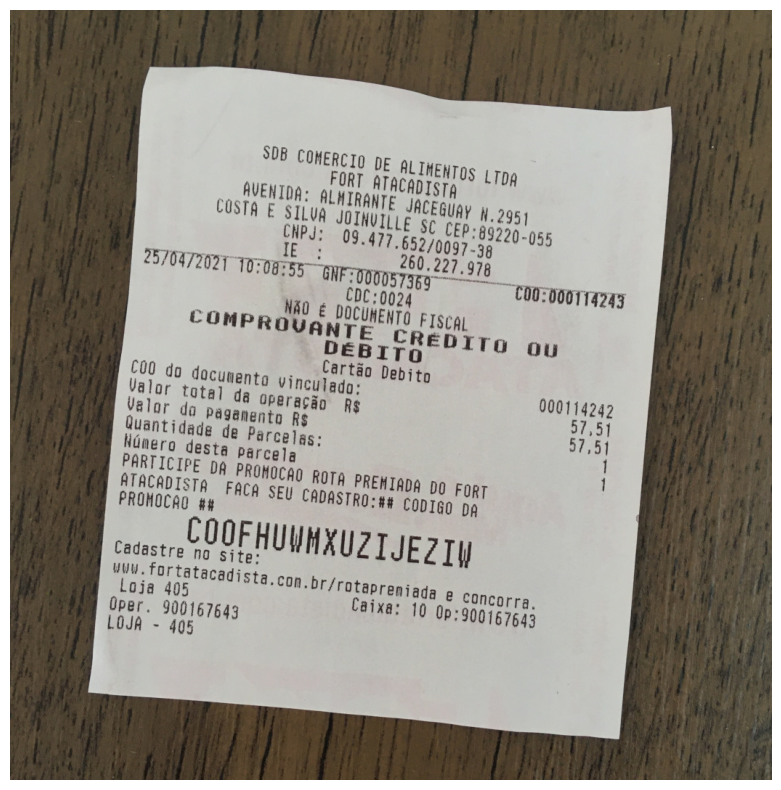

1061 1049


In [20]:
img = cv2.imread('images/Images Project 2/doc_rotated01.jpg')
original = img.copy()
show_img(img)
(H, W) = img.shape[:2]
print(H, W)

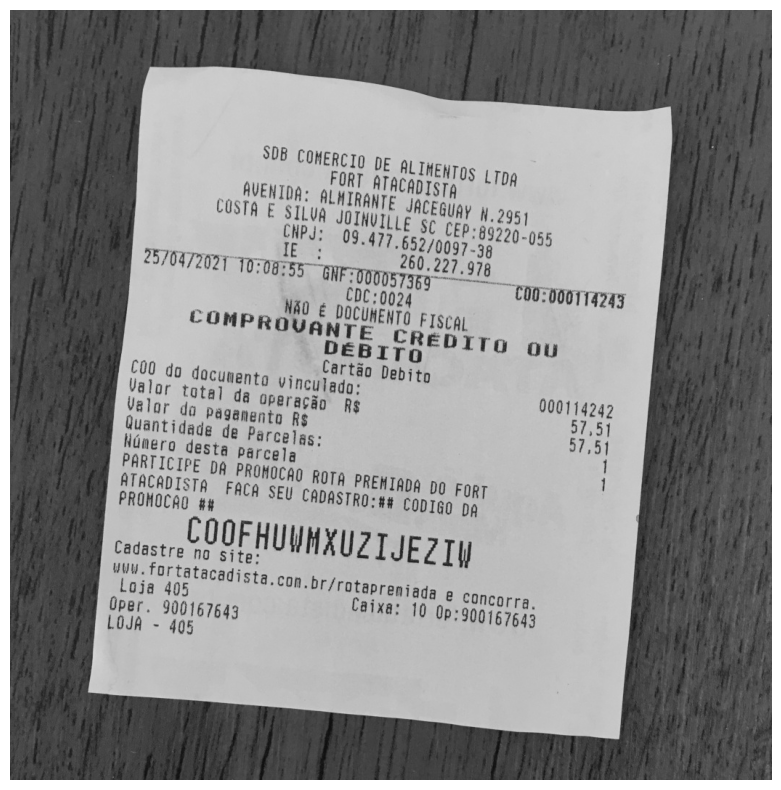

In [21]:
# Gray scale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
show_img(gray)

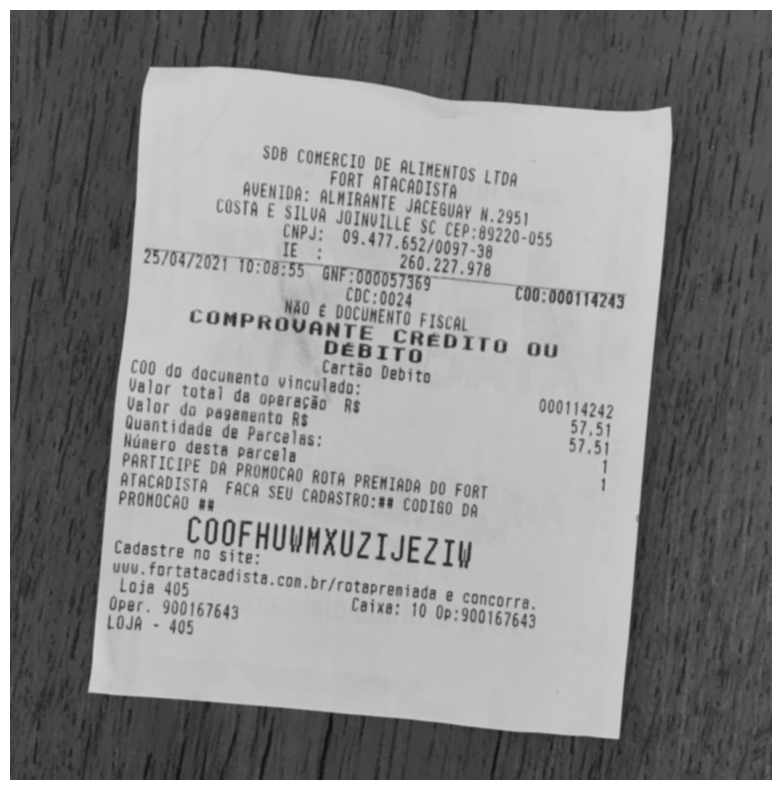

In [22]:
# Gaussian Blur
blur = cv2.GaussianBlur(gray, (5, 5), 0)
show_img(blur)

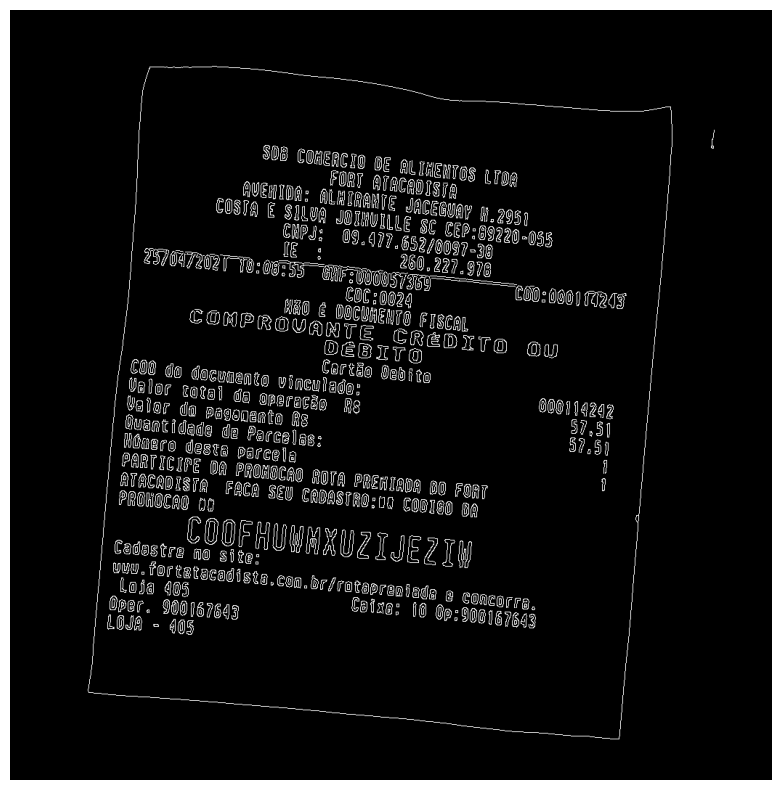

In [23]:
# Border detection
edged = cv2.Canny(blur, 75, 200)
show_img(edged)

In [24]:
def find_contours(img):
    contours = cv2.findContours(img.copy(), cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = imutils.grab_contours(contours)
    contours = sorted(contours, key=cv2.contourArea, reverse=True)[:6]
    return contours

In [25]:
conts = find_contours(edged)
conts

[array([[[278,  77]],
 
        [[277,  78]],
 
        [[250,  78]],
 
        ...,
 
        [[300,  78]],
 
        [[285,  78]],
 
        [[284,  77]]], dtype=int32),
 array([[[277,  78]],
 
        [[278,  77]],
 
        [[284,  77]],
 
        ...,
 
        [[246,  79]],
 
        [[249,  79]],
 
        [[250,  78]]], dtype=int32),
 array([[[298, 702]],
 
        [[296, 704]],
 
        [[295, 704]],
 
        [[294, 705]],
 
        [[294, 707]],
 
        [[293, 708]],
 
        [[293, 719]],
 
        [[292, 720]],
 
        [[292, 729]],
 
        [[291, 730]],
 
        [[291, 731]],
 
        [[292, 732]],
 
        [[292, 734]],
 
        [[295, 737]],
 
        [[296, 737]],
 
        [[297, 738]],
 
        [[301, 738]],
 
        [[302, 737]],
 
        [[304, 737]],
 
        [[307, 734]],
 
        [[307, 731]],
 
        [[308, 730]],
 
        [[308, 722]],
 
        [[309, 721]],
 
        [[309, 710]],
 
        [[310, 709]],
 
        [[309, 708]],
 
        

In [26]:
# Locating the biggest contour

for c in conts:
    perimeter = cv2.arcLength(c, True)
    approximation = cv2.approxPolyDP(c, 0.02 * perimeter, True)
    if len(approximation) == 4:
        screenCnt = approximation
        break

In [27]:
screenCnt

array([[[ 192,   78]],

       [[ 108,  940]],

       [[ 838, 1004]],

       [[ 909,  133]]], dtype=int32)

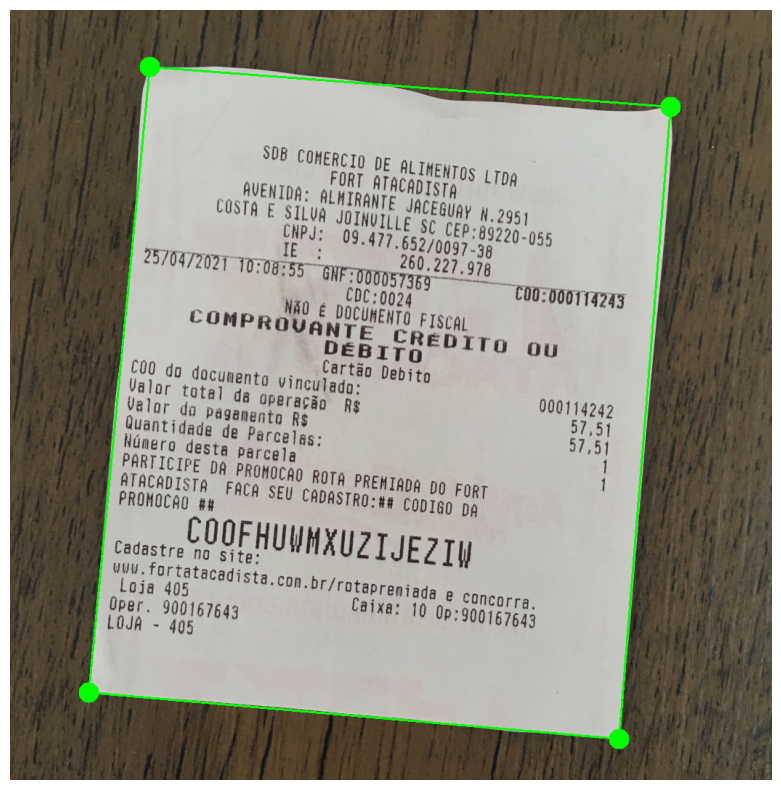

In [28]:
# let's check the contour
cv2.drawContours(img, screenCnt, -1, (0, 255, 0), 28)
cv2.drawContours(img, [screenCnt], -1, (0, 255, 0), 2)
show_img(img)

In [29]:
# Sorting the points
# Top left, top right, bottom right, bottom left

In [33]:
def sort_points(points):
    points = points.reshape((4, 2))
    new_points = np.zeros((4, 1, 2), dtype=np.int32)
    add = points.sum(1)
    # print(add)
    new_points[0] = points[np.argmin(add)]
    new_points[2] = points[np.argmax(add)]

    diff = np.diff(points, axis=1)
    new_points[1] = points[np.argmin(diff)]
    new_points[3] = points[np.argmax(diff)]
    return new_points

In [34]:
screenCnt

array([[[ 192,   78]],

       [[ 108,  940]],

       [[ 838, 1004]],

       [[ 909,  133]]], dtype=int32)

In [35]:
points_larger = sort_points(screenCnt)
print(points_larger)

[[[ 192   78]]

 [[ 909  133]]

 [[ 838 1004]]

 [[ 108  940]]]


In [36]:
# transformation matrix 
pts1 = np.float32(points_larger)
pts1

array([[[ 192.,   78.]],

       [[ 909.,  133.]],

       [[ 838., 1004.]],

       [[ 108.,  940.]]], dtype=float32)

In [37]:
print(W, H)

1049 1061


In [38]:
pts2 = np.float32([[0, 0], [W, 0], [W, H], [0, H]])
pts2

array([[   0.,    0.],
       [1049.,    0.],
       [1049., 1061.],
       [   0., 1061.]], dtype=float32)

In [39]:
matrix = cv2.getPerspectiveTransform(pts1, pts2)
matrix

array([[ 1.47103022e+00,  1.43348652e-01, -2.93618997e+02],
       [-9.58731834e-02,  1.24983768e+00, -7.90796880e+01],
       [ 1.08773828e-05,  2.32288006e-05,  1.00000000e+00]])

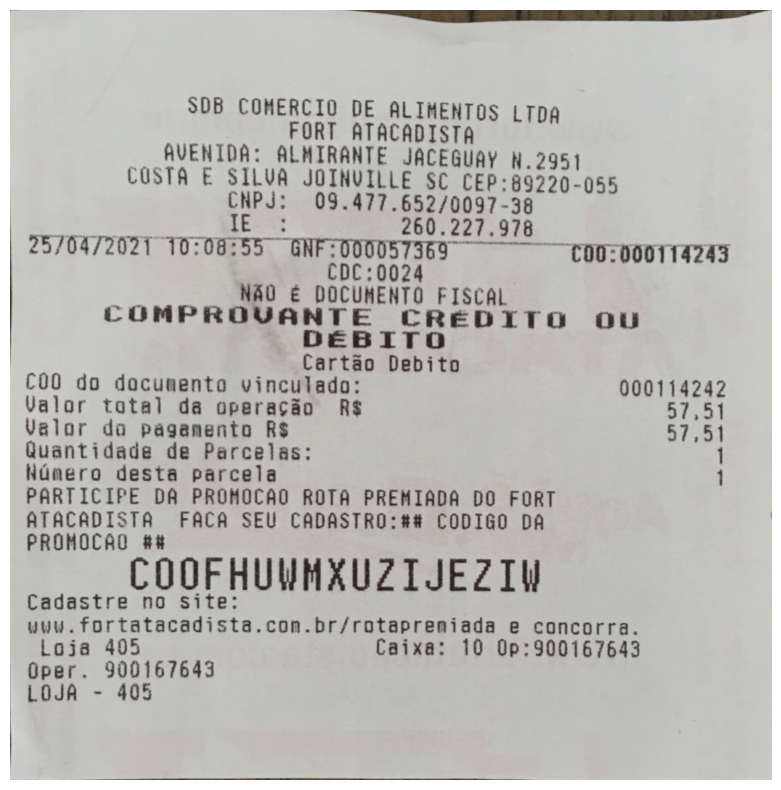

In [40]:
transform = cv2.warpPerspective(original, matrix, (W, H))
show_img(transform)

In [41]:
import pytesseract
config_tesseract = "--tessdata-dir tessdata"
text = pytesseract.image_to_string(transform, lang="por", config=config_tesseract)
print(text)

SDB COMERCIO DE ALIMENTOS LTDA
FORT ATACADISTA
— AVENIDA: ALMIRANTE JACEGUAY N.2951
COSTA E SILVA JOINVILLE SC CEP:89220-055
CNPJ: 09.477.652/0097-38
7 SRAm 260.227.978
2570972027 T0:08:55" Gnrzggvgãzgsà““““'** ***** CO0T0001142A3
NÃO É DOCUMENTO FISCAL
COMPROUANTE CREDITO OU

DÉBIT

Cartão Debito
COO do documento vinculado: 000114242
Valor total da operação R$ RAA
Valor do pagamento R$ BTAA
Quantidade de Parcelas:
Núnmero desta parcela 1

PARTICIPE DA PROMOCAO ROTA PREMIADA DO FORT
ATACADISTA FACA SEU CADASTRO:%% CODIGO DA
PROMOCAO &%

COOFHUWMXUZIJEZIV

Cadastre no site:
uuu.fortatacadista.con.br/rotapreniada e concorra.
Loja 405 Caixa: 10 0p:900167643
Oper. 900167643
LOJA - 405




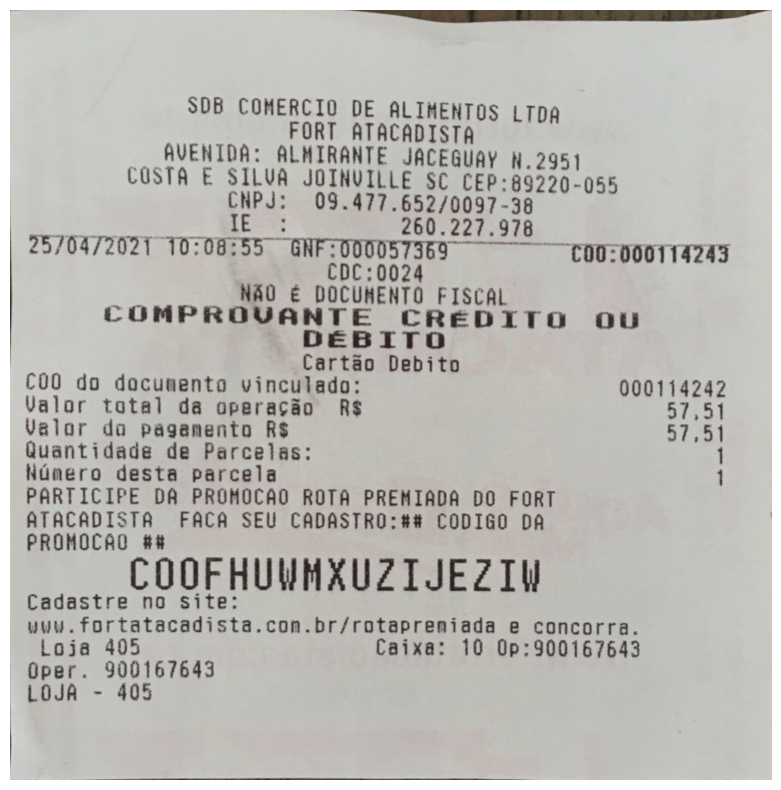

In [42]:
# let's resize it 

increase = cv2.resize(transform, None, fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
show_img(increase)

In [43]:
increase.shape 

(2122, 2098, 3)

In [44]:
# INCREASING BRIGHTNESS AND CONTRAST

brightness = 50
contrast = 80
adjust = np.int16(increase)
adjust.shape

(2122, 2098, 3)

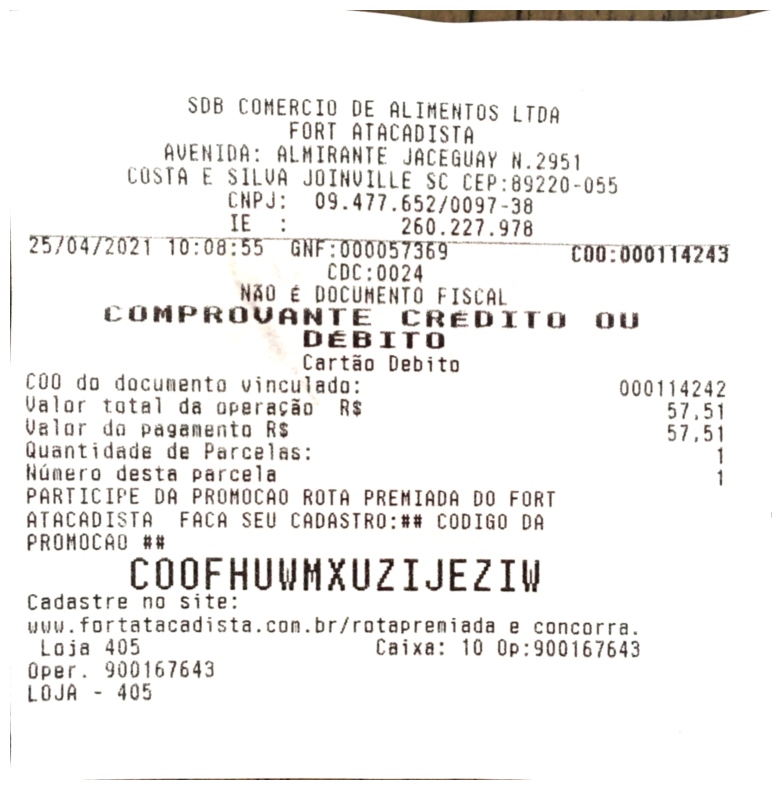

In [45]:
adjust = adjust * (contrast/127+1) - contrast + brightness
adjust = np.clip(adjust, 0, 255)
adjust = np.uint8(adjust)
show_img(adjust)

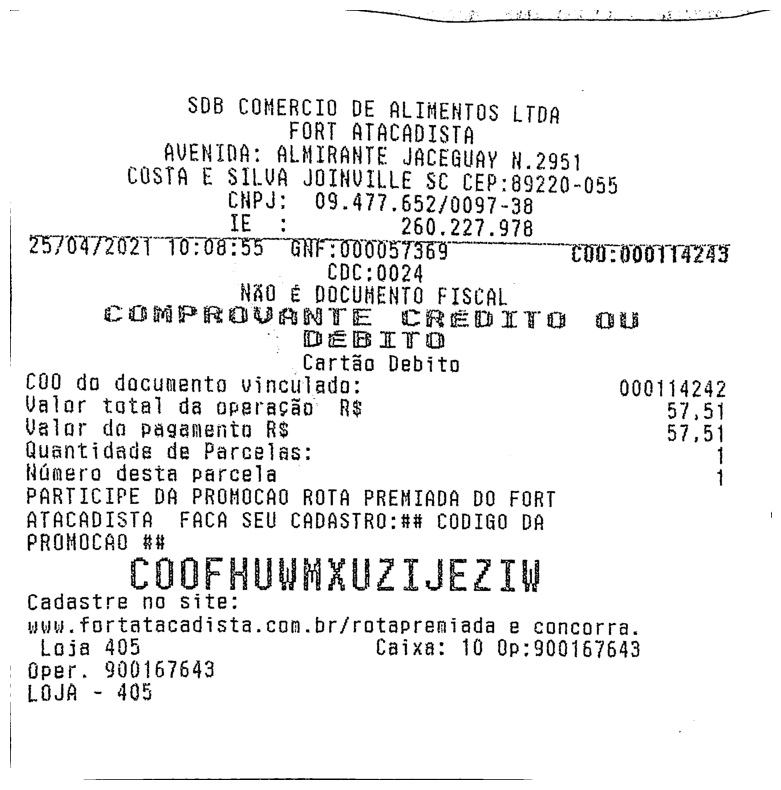

In [60]:
# ADaptive thresholding

processed_img = cv2.cvtColor(adjust, cv2.COLOR_BGR2GRAY)
processed_img = cv2.adaptiveThreshold(processed_img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 5)
show_img(processed_img)

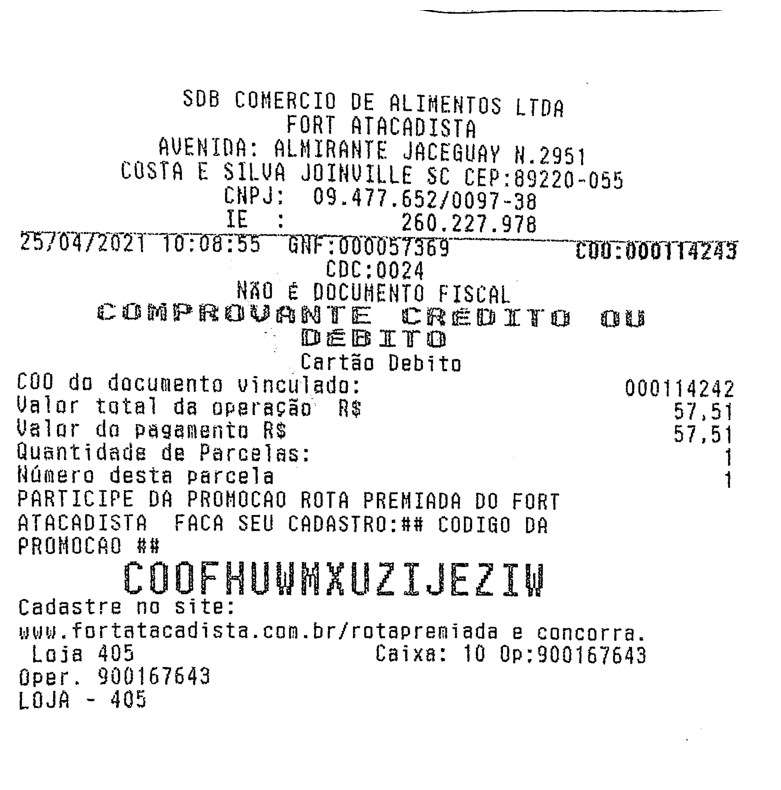

In [63]:
# removing edges
margin = 25
# this means we will remove 18 from top, bottom, left and right
img_edges = processed_img[margin:processed_img.shape[0]-margin, margin:processed_img.shape[1]-margin]
show_img(img_edges)

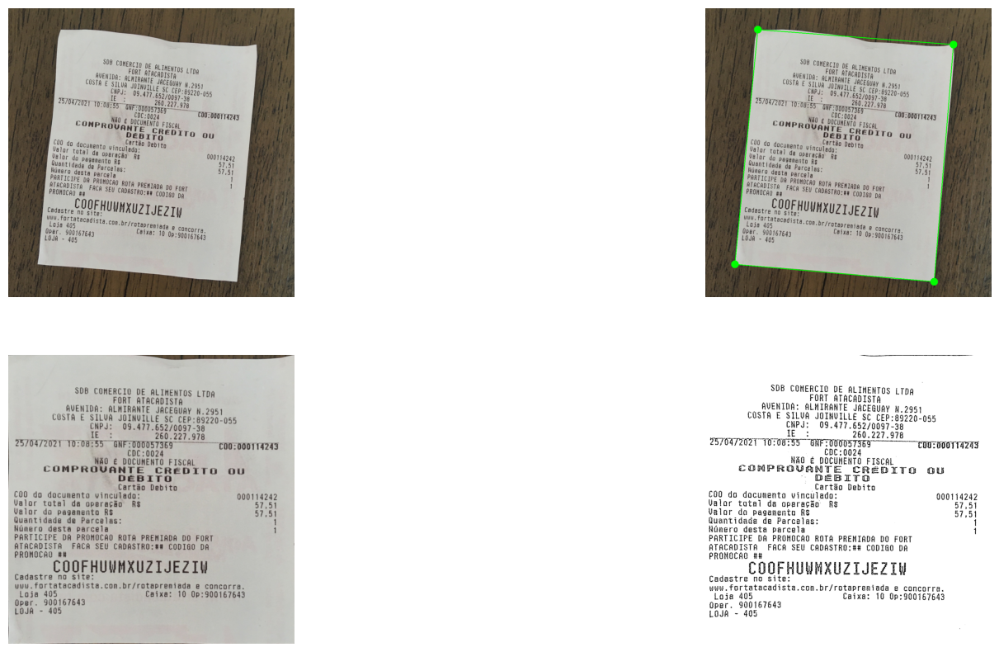

In [65]:
# Comparision
fig, im  = plt.subplots(2, 2, figsize=(20, 10))
for x in range(2):
    for y in range(2):
        im[x, y].axis("off")
im[0, 0].imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
im[0, 1].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
im[1, 0].imshow(cv2.cvtColor(transform, cv2.COLOR_BGR2RGB))
im[1, 1].imshow(cv2.cvtColor(img_edges, cv2.COLOR_BGR2RGB))
plt.show()

In [135]:
# Let's put all together
# read image

def transform_image2(image_file):
    # Let's put all together
    # read image
    img = cv2.imread(image_file)

    # convert to gray
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # threshold
    thresh = cv2.threshold(gray, 180, 255, cv2.THRESH_BINARY)[1]

    # morphology edgeout = dilated_mask - mask
    # morphology dilate
    kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))
    dilate = cv2.morphologyEx(thresh, cv2.MORPH_DILATE, kernel)

    # get absolute difference between dilate and thresh
    diff = cv2.absdiff(dilate, thresh)

    # invert
    edges = 255 - diff
    edged = cv2.Canny(edges, 30, 180)
    show_img(edged)
    conts = find_contours(edged.copy())
    for c in conts:
        peri = cv2.arcLength(c, True)
        aprox = cv2.approxPolyDP(c, 0.025 * peri, True)

        if len(aprox) == 4:
            larger = aprox
            break

    cv2.drawContours(img, larger, -1, (120, 255, 0), 28)
    cv2.drawContours(img, [larger], -1, (120, 255, 0), 2)
    show_img(img)

    points_larger = sort_points(larger)
    pts1 = np.float32(points_larger)
    pts2 = np.float32([[0, 0], [W, 0], [W, H], [0, H]])

    matrix = cv2.getPerspectiveTransform(pts1, pts2)
    transform = cv2.warpPerspective(original, matrix, (W, H))

    show_img(transform)
    return transform

In [159]:

def transform_image(image_file):
  img = cv2.imread(image_file)
  original = img.copy()
  show_img(img)
  (H, W) = img.shape[:2]

  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  blur = cv2.GaussianBlur(gray, (7, 7), 0)
  # processed_img = cv2.adaptiveThreshold(blur, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 7)
  edged = cv2.Canny(blur, 30, 180)
  show_img(edged)
  conts = find_contours(edged.copy())
  for c in conts:
    peri = cv2.arcLength(c, True)
    aprox = cv2.approxPolyDP(c, 0.025 * peri, True)
    print(len(aprox))
    if len(aprox) > 4:
      larger = aprox[ : 4]
      break

  cv2.drawContours(img, larger, -1, (120, 255, 0), 28)
  cv2.drawContours(img, [larger], -1, (120, 255, 0), 2)
  show_img(img)

  points_larger = sort_points(larger)
  pts1 = np.float32(points_larger)
  pts2 = np.float32([[0, 0], [W, 0], [W, H], [0, H]])

  matrix = cv2.getPerspectiveTransform(pts1, pts2)
  transform = cv2.warpPerspective(original, matrix, (W, H))# removing edges
  
  margin = 15
  # this means we will remove 18 from top, bottom, left and right
  img_edges = transform[margin:transform.shape[0]-margin, margin:transform.shape[1]-margin]
  show_img(img_edges)
  return img_edges

In [127]:
def process_img(img):
  processed_img = cv2.resize(img, None, fx=1.6, fy=1.6, interpolation=cv2.INTER_CUBIC)
  processed_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
  processed_img = cv2.adaptiveThreshold(processed_img, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 9)
  return processed_img

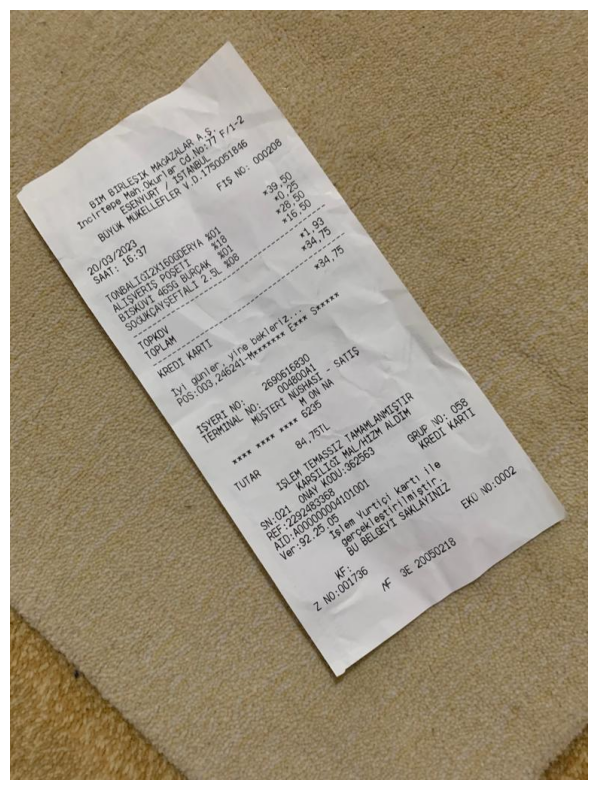

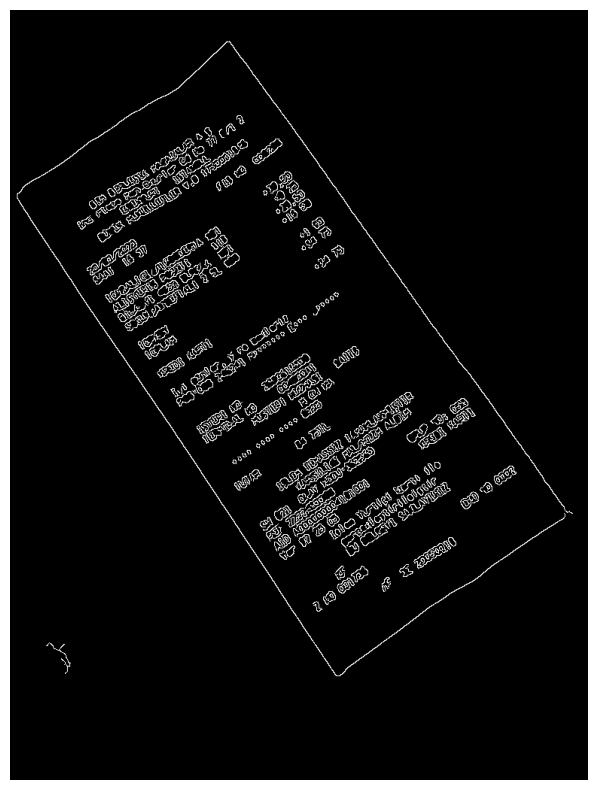

8


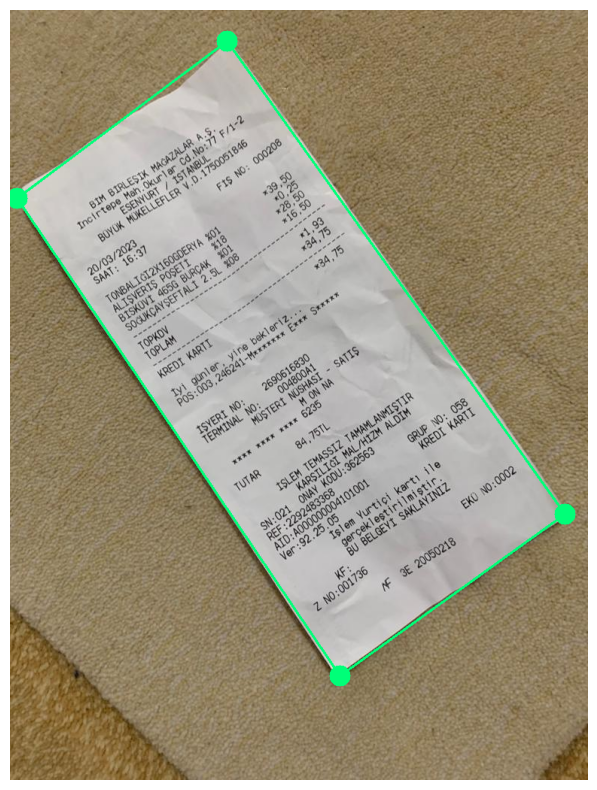

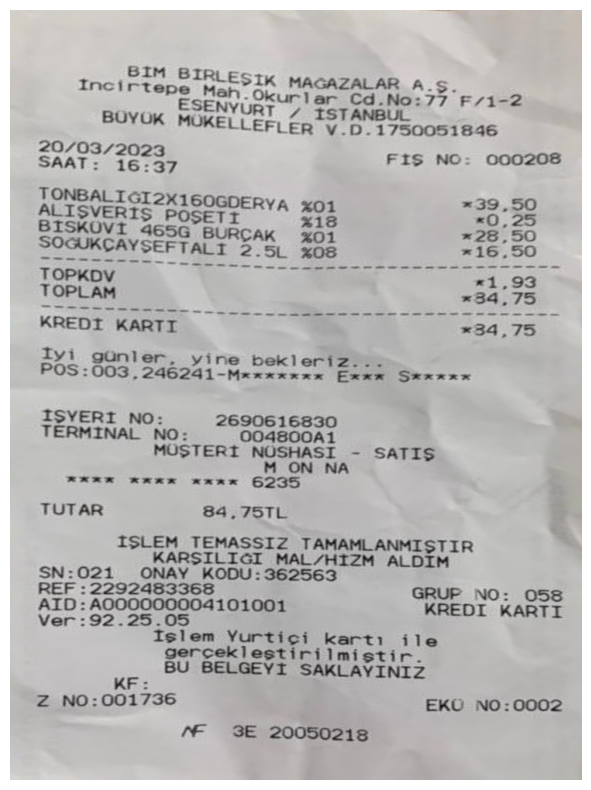

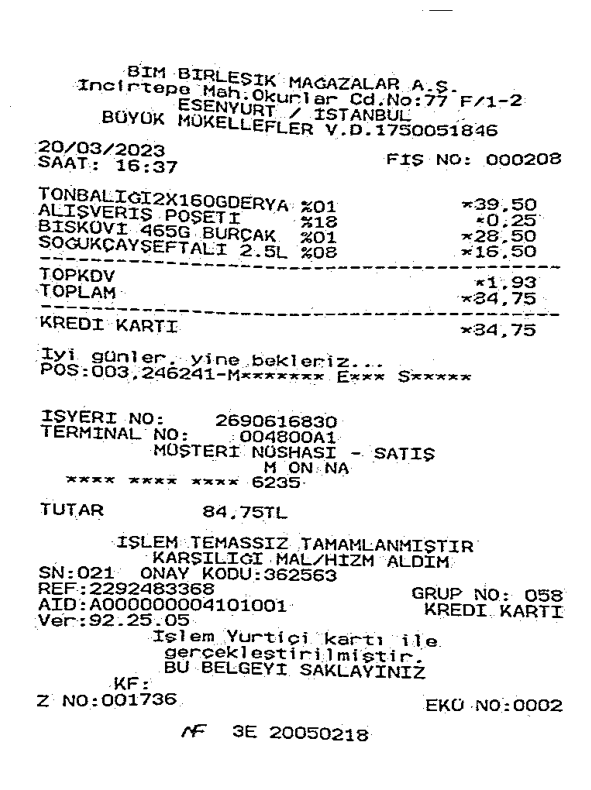

In [160]:
img_file = "images/bim03.jpeg"
# img = cv2.imread(img_file)
img = transform_image(img_file)
img = process_img(img)
show_img(img)

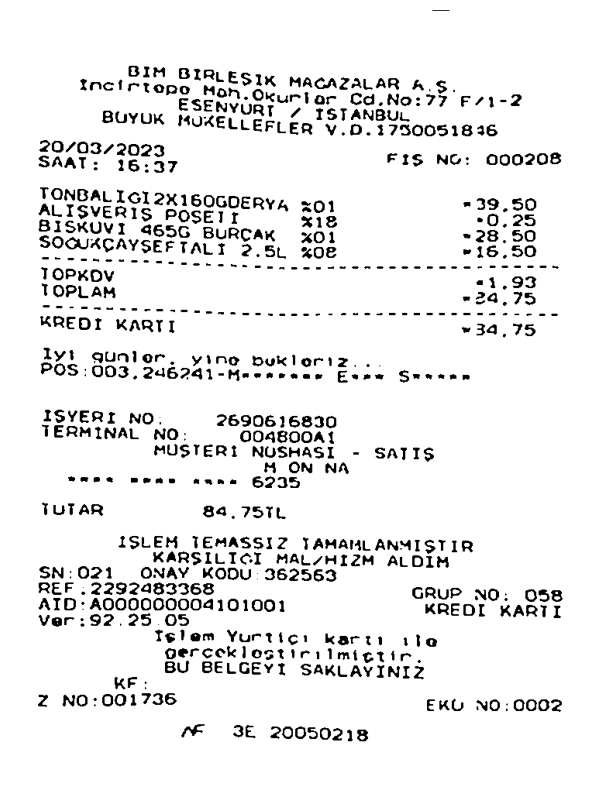

BIM Bıri
İnctrtopo NZESIK MACAZALAR AŞ

N. O : : -
ESSNVURŞU'—İGF Cd.No:77 F/1-2

b Z TSTANBUL
BOYUK MÜKELLEFLER V.D. 17850051836

20/03/2023 : 208
SRAYO” 2023 FİS NO: 000
TONBALIGI2X1606GD! »39.50
ALIŞVERİŞ poseııERvA *0.25
BİSKUVI 4656 BURCAK *28/50
SOCUAÇAYSEFTALI 2.5L *16,50
TorPKOV TU <«1,93
TOPLAM -24,75
KREDI KARTI TU *34,75

Y? günler. yine bukloriz..
POS:003,246241-Masnenar Eerw Sunsan

İSYERİ NO. 26906116830
TERMİNAL NO; ODABOOA 1
MÜSTERİ NUSHASI - SATIŞ
M ON NA
a.. rene asana 6205
TUTAR 8a,75TL

İŞLEM TEMASSIZ TAMAMLANMIŞTIR
KARSILIĞI MAL/HİIZM ALDIİM
SN:021 ONAY KODU 362563

REF . 22924083368 GRUP NO: 058
ATD:A000000004101001 KREDİ KARTI
Ver:92.25 05

İçlem Yuürtiçci kartı 1la

gerceklestirilmiçctir.
BU BELGEYİ SAKLAYINIZ
KF :
Z NO:001736 EKU NO:0002

#f 3E 20050218



In [171]:
def noise_removal(image):
    kernel = np.ones((1, 1), np.uint8)
    image = cv2.dilate(image, kernel, iterations=1)
    kernel = np.ones((1, 1), np.uint8)
    image = cv2.erode(image, kernel, iterations=1)
    image = cv2.morphologyEx(image, cv2.MORPH_CLOSE, kernel)
    image = cv2.medianBlur(image, 3)
    return image
img = noise_removal(img)
show_img(img)
config_tesseract = "--tessdata-dir tessdata"
text = pytesseract.image_to_string(img, lang="tur", config=config_tesseract)
print(text)

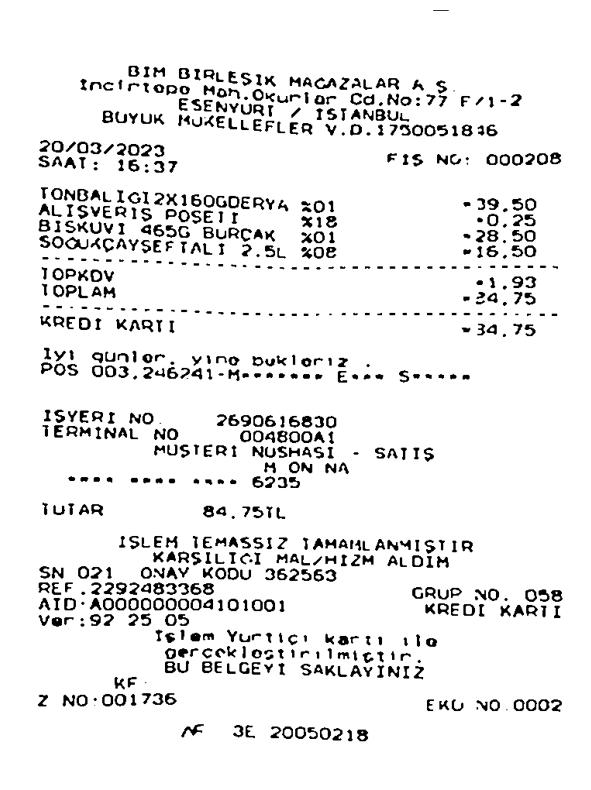

BİM BİRLEŞİK MACAZALAR A s
chirıongSğgşügşuçışgrîsâso:77 F/1-2
BUYUK MÜZELLEFLER V.D. 17500518116
20/03/2023 : 208

SAAT: 16:37 FiS NG: 000
TONBALIGĞI2X16OGDERYA < -39.50
ALIŞVERİŞ POSETT C YA B :*0.25
BİSKUVİ 4656 BURCAK Xx01 *28,50
SOCUAÇAYSEFTALI 2.5L X08 »*16,50
TOPKOV U .1.93
TOPLAM -34,75
KREDİ KARTI U *34,75
lyi günler. yiıne bukleriz .
POS 003,2496241-Manmener Fese Sunsan
İSYERİ NO 2690616830
TERMİNAL NO OOABODA 1

MÜSŞTERİ NÜUSHASİ - SATİIŞ

M ON NA
.. erne annae 6735
TUTAR 8a,751L
İŞLEM TEMASSIZ TAMAHLANMIŞTIR

KARSILIĞI MAL/HIZM ALDİIM
SN 021 ONAY KODU 3962563
REF .2292083368 GRUP NO. O58
ATD'A000000004101001 KREDİ KARTI
Ver:92 25 05

İçlem Yurtiçci kartı 1la

gerceklestirilmiçctir.

BU BELGEYİ SAKLAYINIZ

KF
Z NO:001736 EKU NO. 0002
# 3E 20050218



In [172]:

img = noise_removal(img)
show_img(img)
config_tesseract = "--tessdata-dir tessdata --psm 6"
text = pytesseract.image_to_string(img, lang="tur", config=config_tesseract)
print(text)

In [164]:
config_tesseract = "--tessdata-dir tessdata --psm 4"
text = pytesseract.image_to_string(img, lang="tur", config=config_tesseract)
print(text)

“BIM -BIİRL :
İnctirtepe MaESIK MAGAZALAR A,

5.

>Okurlar Cd.No:77 F/1-2
; ESENYÜRT. / İSTANBUL — —

BÖYOK MÜKELLEFLER V.D.1750051846

20/03/2023 : OZO08
SAAT.: 16:37 FES-NO: 00
TONBALIĞİ2ZKISOGDERYA: © >39,50
ALIŞVERİS POSETE 'V 402 x0525
BİSKÜVİI 4656 BURÇAK ZO1 x28.50
SOĞUKÇAYSEFTALI 2.5L Z208 x165,.S0
TOPKDV

“TOPLAM

EYİ. günler. yine bBekleriz...
POS:003,24Ö241-Mxxxxxxx Exxx Suxxxu

İSYERİ NO: 26906516830
TERMİNAL NO: OD4ASODALT
MÜŞTERİ NÜSHASI - SATIŞ
M O ON:NA

XAXX XWXX xxxx 5235
TUTAR 84,75TL

İŞLEM TEMASSIZ TAMAMLANMIŞTIR
, KARSILIĞI MAL/HİZM ALDİM
SN:021 ONAY KODU:3652553
REF-: 22921483358 GRUP NO: 058
ATD:A0009000004101001 KREDEİI. KARTI
Ver:92.25.05 .
İşlem Yürtiçi kartı ile
gerçeklestirilmiştir.
BU BELGEYİ SAKLAYINIZ
KF z
Z NO:001736 EKÜ NO2:0002

#F SE 20050218

